In [2]:
import pickle
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pyabf


In [3]:
with open("binned_waveforms.pkl", "rb") as f:
    binned_waveforms = pickle.load(f)

print("Loaded:", list(binned_waveforms.keys())[:5])  # peek at a few keys
print(len(binned_waveforms.keys()))
one_key = list(binned_waveforms.keys())[0]
binned_waveforms[one_key]

Loaded: [(np.float64(25.233409033558843), 'Excitatory', 'CaP', 'primary'), (np.float64(32.61578604044627), 'Excitatory', 'CaP', 'primary'), (np.float64(36.50967506389131), 'Excitatory', 'CaP', 'primary'), (np.float64(26.212319790300285), 'Excitatory', 'CaP', 'primary'), (np.float64(22.836263987212853), 'Excitatory', 'CaP', 'primary')]
14890


,Phase Bin,Current,Normalized Current,Phase
0,"(-0.001, 0.02]",-607.958923,0.382365,0.01
1,"(0.02, 0.04]",-601.768738,0.390906,0.03
2,"(0.04, 0.06]",-657.632141,0.313825,0.05
3,"(0.06, 0.08]",-623.532043,0.360877,0.07
4,"(0.08, 0.1]",-708.991272,0.242958,0.09
5,"(0.1, 0.12]",-675.252747,0.289511,0.11
6,"(0.12, 0.14]",-595.503784,0.399551,0.13
7,"(0.14, 0.16]",-733.101624,0.209690,0.15
8,"(0.16, 0.18]",-706.474121,0.246431,0.17
9,"(0.18, 0.2]",-769.347290,0.159678,0.19


In [4]:
from collections import Counter

def get_freq_bin(freq):
    if 15 <= freq < 25:
        return "15–25"
    elif 25 <= freq < 35:
        return "25–35"
    elif 35 <= freq < 45:
        return "35–45"
    elif freq >= 45:
        return "45+"
    else:
        return "<15"

def group_iSMN(cell_type):
    if cell_type in ["iSMN (dorsal) muscle", "iSMN"]:
        return "iSMN"
    return cell_type
key_counts_all = Counter()

for freq, signal_type,cell_type, fast_slow in binned_waveforms.keys():
    freq_bin = get_freq_bin(freq)
    cell_type_gen = group_iSMN(cell_type)
    grouped_key = (freq_bin, signal_type, cell_type_gen, fast_slow)
    key_counts_all[grouped_key] += 1

In [5]:
list(key_counts_all.keys())[:5]

[('25–35', 'Excitatory', 'CaP', 'primary'),
 ('35–45', 'Excitatory', 'CaP', 'primary'),
 ('15–25', 'Excitatory', 'CaP', 'primary'),
 ('<15', 'Excitatory', 'CaP', 'primary'),
 ('45+', 'Excitatory', 'CaP', 'primary')]

In [6]:
from collections import Counter

def get_freq_bin(freq):
    if 20 <= freq < 30:
        return "20–30"
    elif 30 <= freq < 40:
        return "30–40"
    elif 40 <= freq <= 50:
        return "40–50"
    else:
        return None  # Skip anything outside 20–50 Hz

def group_iSMN(cell_type):
    if cell_type in ["iSMN (dorsal) muscle", "iSMN"]:
        return "iSMN"
    return cell_type

# Count only excitatory signals within 20–50 Hz
excitatory_counts = Counter()

for freq, signal_type, cell_type, fast_slow in binned_waveforms.keys():
    if signal_type != "Excitatory":
        continue  # Skip inhibitory signals

    freq_bin = get_freq_bin(freq)
    if freq_bin is None:
        continue  # Skip frequencies outside 20–50 Hz

    cell_type_grouped = group_iSMN(cell_type)
    key = (freq_bin, cell_type_grouped)
    excitatory_counts[key] += 1

# Print the results
print("Excitatory signal counts by frequency bin and cell type:")
for key, count in sorted(excitatory_counts.items()):
    print(f"{key}: {count}")


Excitatory signal counts by frequency bin and cell type:
('20–30', 'CaP'): 325
('20–30', 'MiP'): 277
('20–30', 'dRoP'): 123
('20–30', 'dSMN'): 56
('20–30', 'dVS'): 30
('20–30', 'iSMN'): 206
('20–30', 'vRoP'): 485
('20–30', 'vSMN'): 270
('30–40', 'CaP'): 16
('30–40', 'MiP'): 207
('30–40', 'dRoP'): 33
('30–40', 'dSMN'): 282
('30–40', 'dVS'): 15
('30–40', 'iSMN'): 62
('30–40', 'vRoP'): 520
('30–40', 'vSMN'): 174
('40–50', 'CaP'): 7
('40–50', 'MiP'): 92
('40–50', 'dRoP'): 4
('40–50', 'dSMN'): 66
('40–50', 'dVS'): 6
('40–50', 'iSMN'): 19
('40–50', 'vRoP'): 66
('40–50', 'vSMN'): 28


In [18]:
def average_waveforms_for_key(counter_key):
    '''
    Function that takes a counter key like ('15–25', 'Cell-attached', 'MiP', 'primary')
    Returns a DataFrame with mean and SEM of normalized current for that key
    '''
    import numpy as np

    # Separate key code
    freq_bin, signal_type, cell_type, fast_slow = counter_key

    dfs = []  # To store matching waveform dataframes
    # loop through all binned waveforms
    for key in binned_waveforms.keys():
        freq, st, ct, fs = key
        # use get_freq_bin(freq) to turn float into bin, use group_iSMN() to generalize all iSMN
        if get_freq_bin(freq) == freq_bin and ct == group_iSMN(cell_type) and st == signal_type and fs == fast_slow:
            dfs.append(binned_waveforms[key].copy())

    # if no waveforms for key
    if not dfs:
        print(f"No matching waveforms found for {counter_key}")
        return None

    combined = pd.concat(dfs)

    # Compute mean and SEM per phase bin
    grouped = combined.groupby('Phase', observed=False)['Normalized Current']
    averaged = grouped.mean().reset_index(name='Normalized Current')
    sem = grouped.sem().reset_index(name='SEM')
    # Ensure SEM is float type
    sem['SEM'] = sem['SEM'].astype(float)
    # Merge mean and SEM into a single DataFrame
    result = pd.merge(averaged, sem, on='Phase')
    return result


In [21]:
one_counter_key = list(key_counts_all.keys())[0]
ex_avg_df = average_waveforms_for_key(one_counter_key)
ex_avg_df.head()

,Phase,Normalized Current,SEM
0,0.01,0.630261,0.016485
1,0.03,0.627311,0.015547
2,0.05,0.617013,0.015767
3,0.07,0.594397,0.016277
4,0.09,0.581982,0.015091


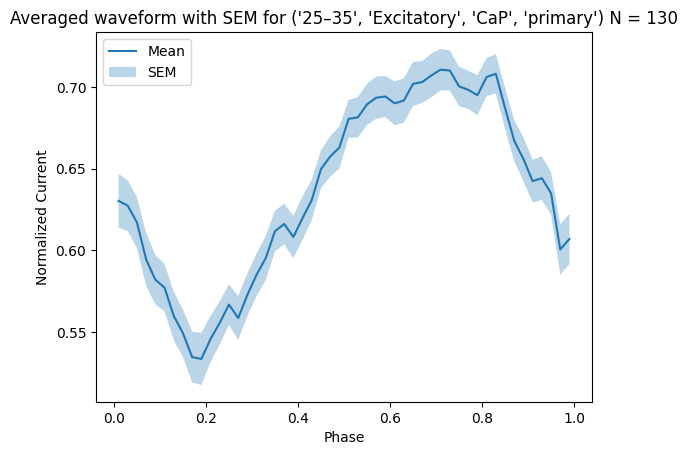

In [28]:
def plot_avg_wf(avg_waveform_df,key):
    count = key_counts_all[key]  # Get count for current key

    if avg_waveform_df is not None:
        plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'], label='Mean')
        plt.fill_between(avg_waveform_df['Phase'],
                        avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                        avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                        alpha=0.3, label='SEM')
        plt.xlabel('Phase')
        plt.ylabel('Normalized Current')
        plt.title(f'Averaged waveform with SEM for {key} N = {count}')
        plt.legend()
        plt.show()

plot_avg_wf(ex_avg_df,one_counter_key)

/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_46961/4135082839.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))


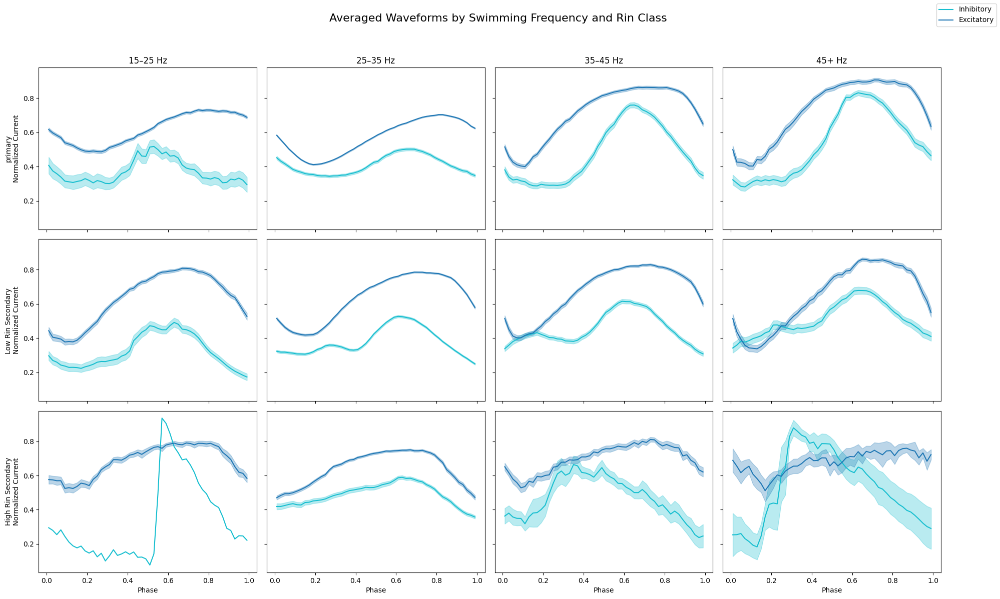

In [31]:
import matplotlib.cm as cm

# Frequency bins and swimming speed categories
freq_bins = ["15–25", "25–35", "35–45", "45+"]
speed_categories = ["primary", "Low Rin Secondary ", "High Rin Secondary"]
signal_types = ["Inhibitory", "Excitatory"]

# Assign unique colors to signal types
cmap = cm.get_cmap('tab10', len(signal_types))
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

# Create 3x4 subplots: rows = swimming speeds, columns = frequency bins
fig, axes = plt.subplots(len(speed_categories), len(freq_bins), figsize=(20, 12), sharex=True, sharey=True)

# Track which labels have been used to avoid duplicates in the legend
used_labels = set()
count = 0
# Loop through each combination of speed and frequency bin
for i, speed in enumerate(speed_categories):
    for j, freq_bin in enumerate(freq_bins):
        ax = axes[i, j]

        for signal_type in signal_types:
            # Construct the key without cell type
            matching_keys = [key for key in binned_waveforms.keys()
                             if get_freq_bin(key[0]) == freq_bin and
                                key[1] == signal_type and
                                key[3] == speed]
            dfs = [binned_waveforms[key].copy() for key in matching_keys]
            if not dfs:
                continue
            count += 1
            combined = pd.concat(dfs)
            grouped = combined.groupby('Phase Bin', observed=False)
            averaged = grouped.mean().reset_index()
            sem = grouped.sem().reset_index()

            label = signal_type if signal_type not in used_labels else None
            ax.plot(averaged['Phase'], averaged['Normalized Current'],
                    label=label, color=signal_type_colors[signal_type])
            ax.fill_between(averaged['Phase'],
                            averaged['Normalized Current'] - sem['Normalized Current'],
                            averaged['Normalized Current'] + sem['Normalized Current'],
                            color=signal_type_colors[signal_type], alpha=0.3)
            used_labels.add(signal_type)

        # Add subplot title and labels
        if i == 0:
            ax.set_title(f"{freq_bin} Hz")
        if j == 0:
            ax.set_ylabel(f"{speed}\nNormalized Current")
        if i == len(speed_categories) - 1:
            ax.set_xlabel("Phase")

# Finalize layout and add legend to the figure
handles, labels = [], []
for stype in signal_types:
    handles.append(plt.Line2D([0], [0], color=signal_type_colors[stype]))
    labels.append(stype)
fig.legend(handles, labels, loc='upper right')
fig.suptitle("Averaged Waveforms by Swimming Frequency and Rin Class", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()

/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_46961/730917152.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(keys))


No matching waveforms found for ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('35–45', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('35–45', 'Excitatory', 'iSMN', 'High Rin Secondary')


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_46961/730917152.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.8, 1])


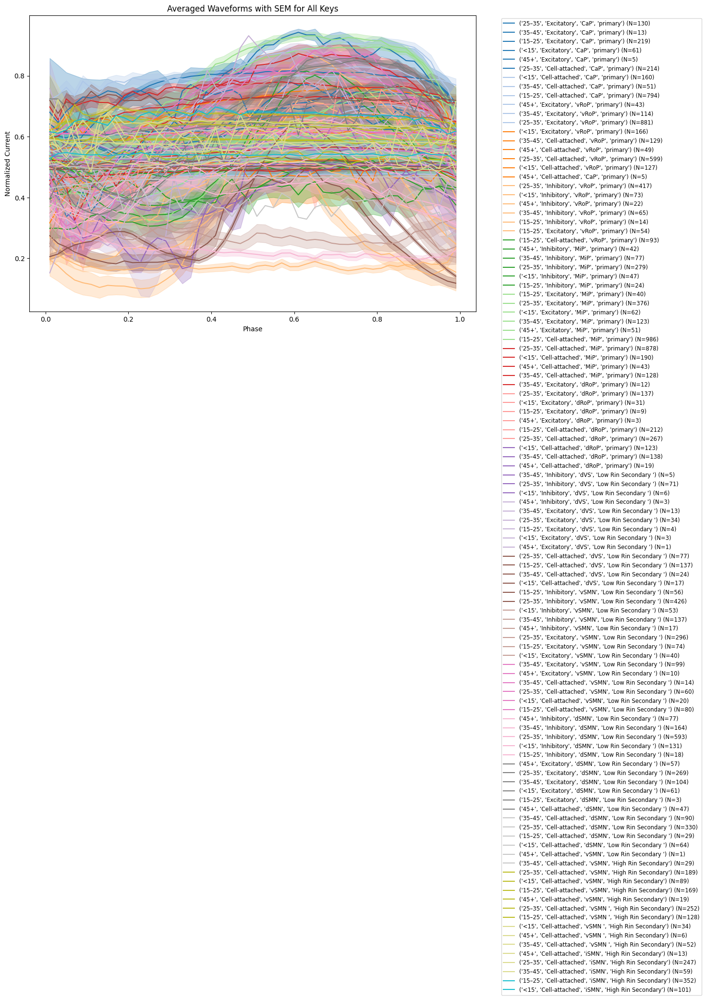

In [33]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Set up color map based on number of unique keys
keys = list(key_counts_all.keys())
cmap = cm.get_cmap('tab20', len(keys))

# Create a single figure
fig, ax = plt.subplots(figsize=(12, 8))

# Plot each waveform on the same axis
for idx, key in enumerate(keys):
    count = key_counts_all[key]
    avg_waveform_df = average_waveforms_for_key(key)

    if avg_waveform_df is not None:
        color = cmap(idx)
        label = f"{key} (N={count})"

        ax.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'], label=label, color=color)
        ax.fill_between(avg_waveform_df['Phase'],
                        avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                        avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                        color=color, alpha=0.3)

# Label and title
ax.set_xlabel('Phase')
ax.set_ylabel('Normalized Current')
ax.set_title('Averaged Waveforms with SEM for All Keys')
ax.legend(fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout(rect=[0, 0, 0.8, 1])
plt.show()


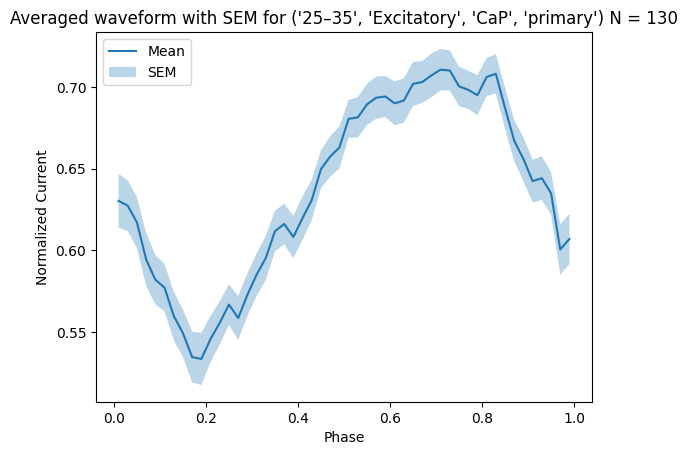

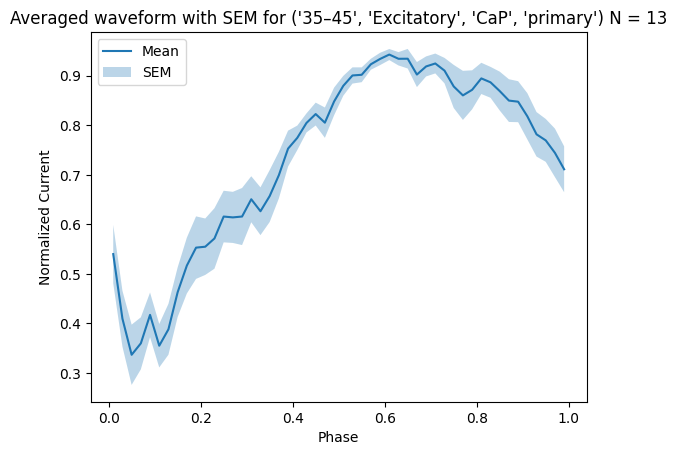

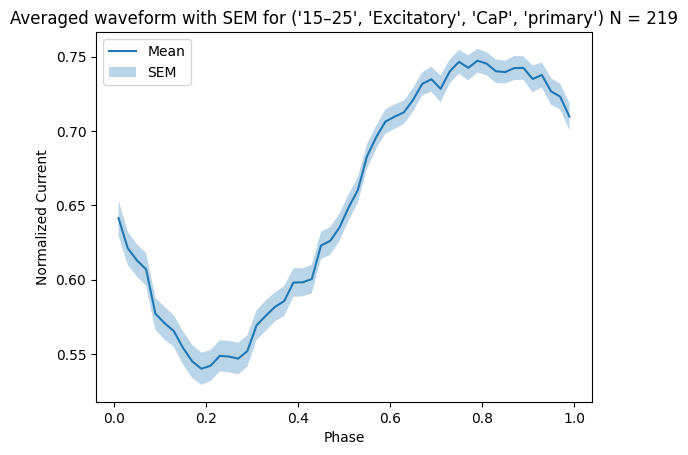

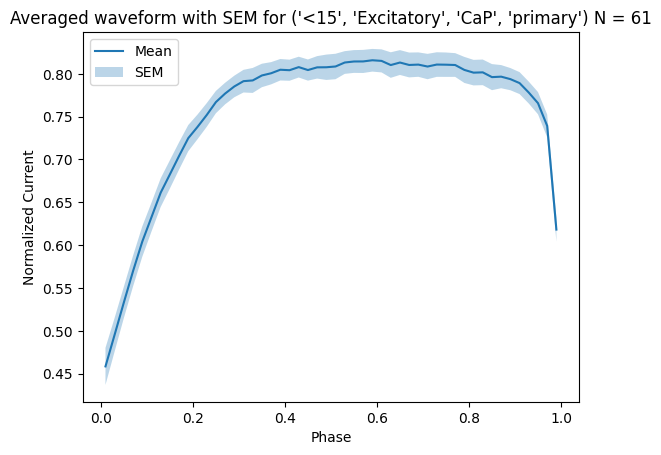

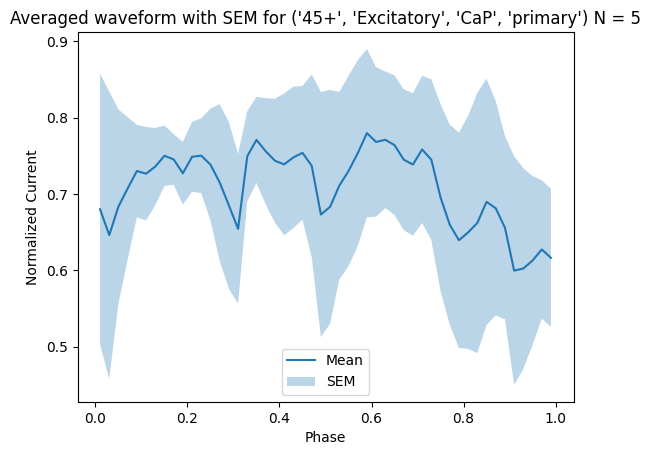

...

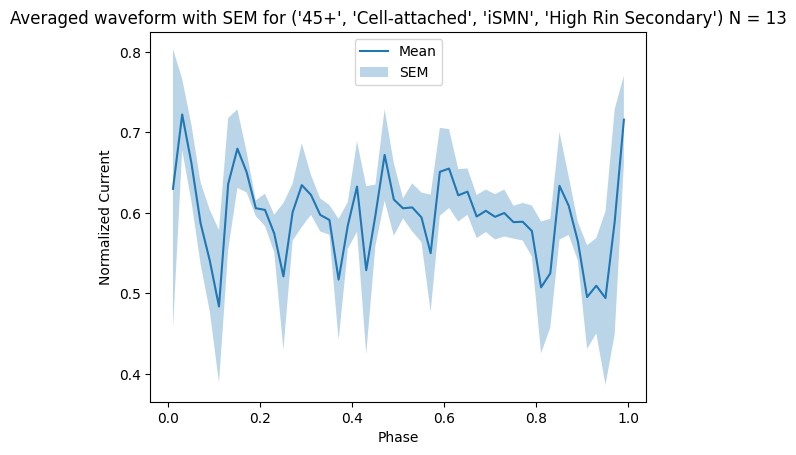

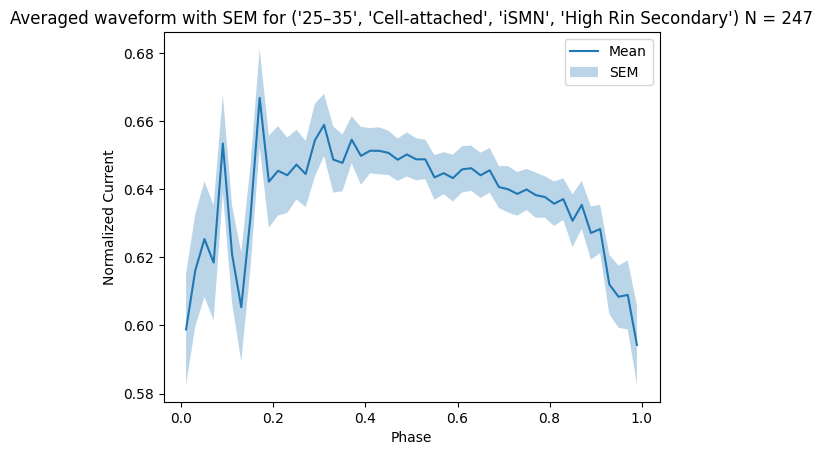

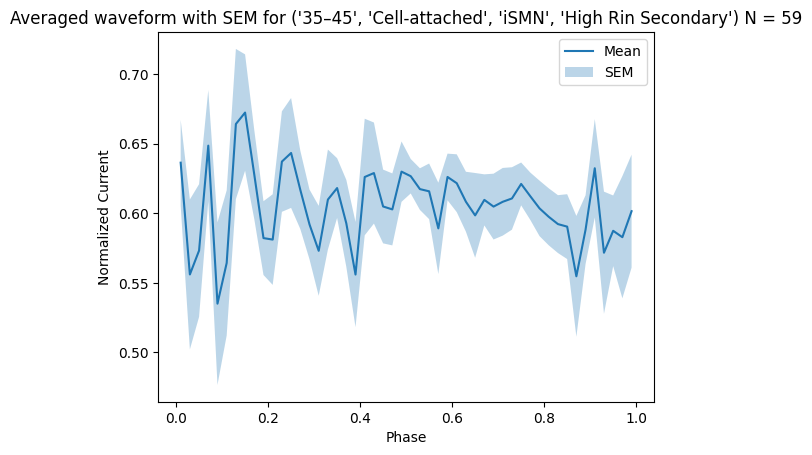

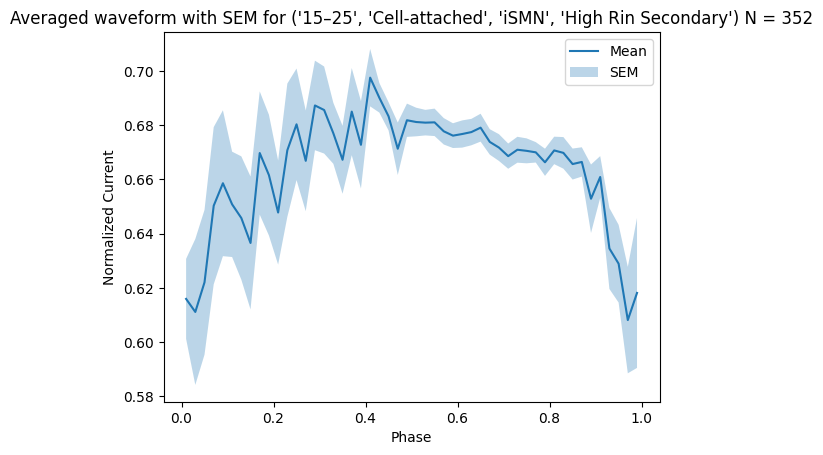

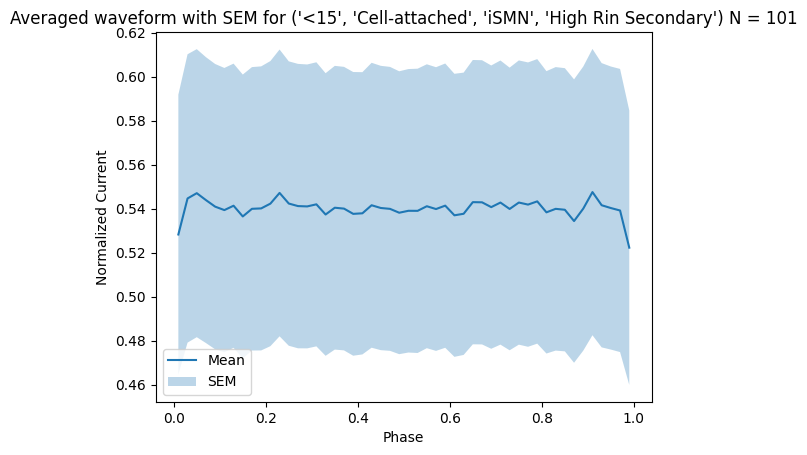

No matching waveforms found for ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('35–45', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('35–45', 'Excitatory', 'iSMN', 'High Rin Secondary')


In [29]:
for key in key_counts_all.keys():
    count = key_counts_all[key]  # Get count for current key
    avg_waveform_df = average_waveforms_for_key(key)
    plot_avg_wf(avg_waveform_df,key)

/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_46961/1796533653.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))


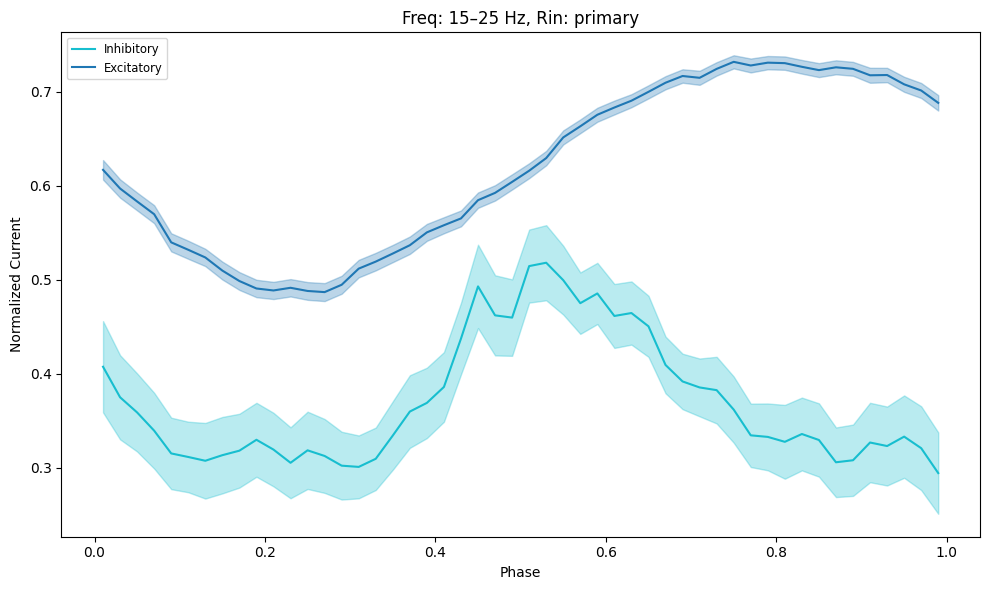

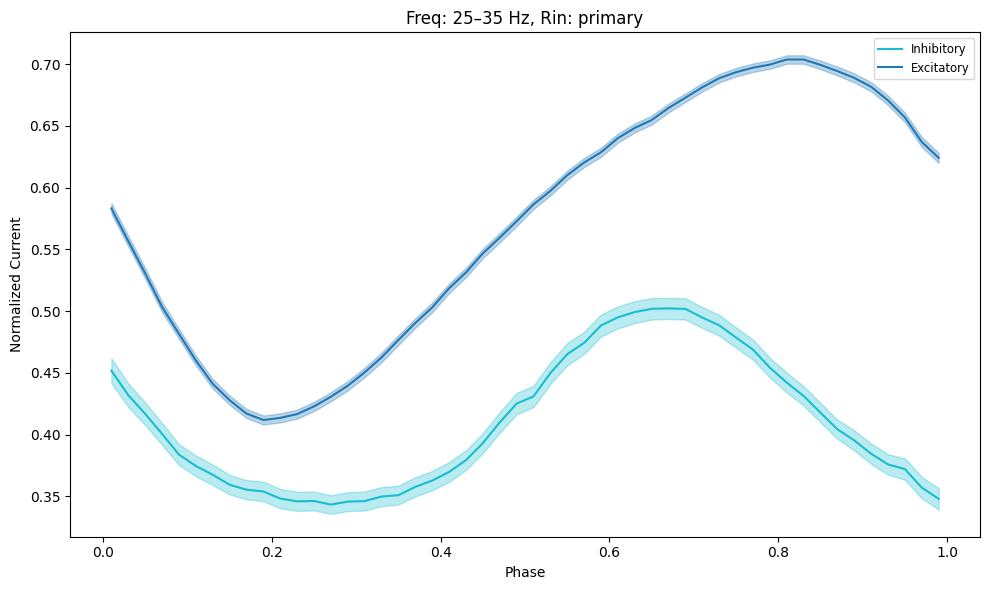

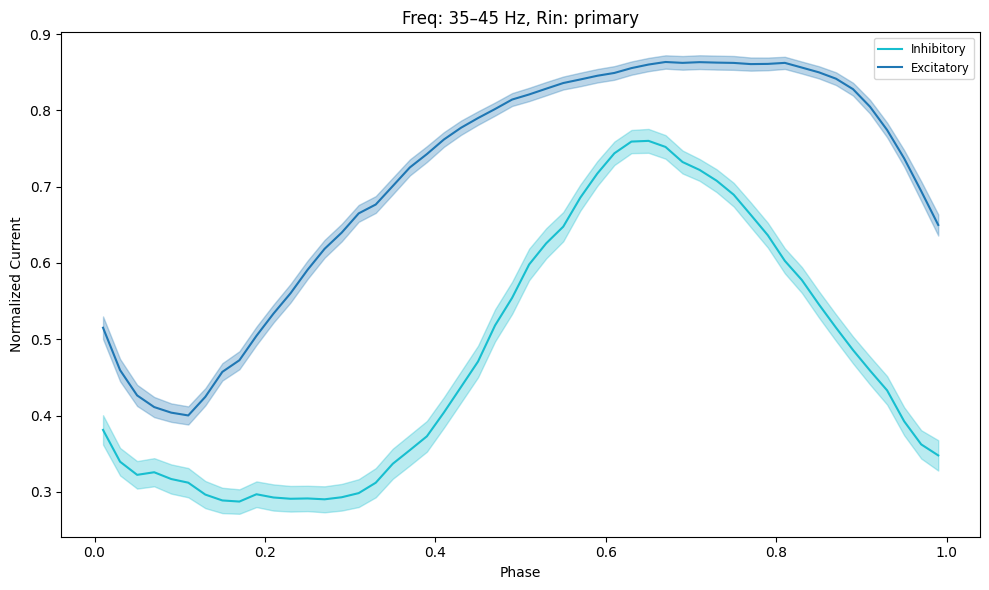

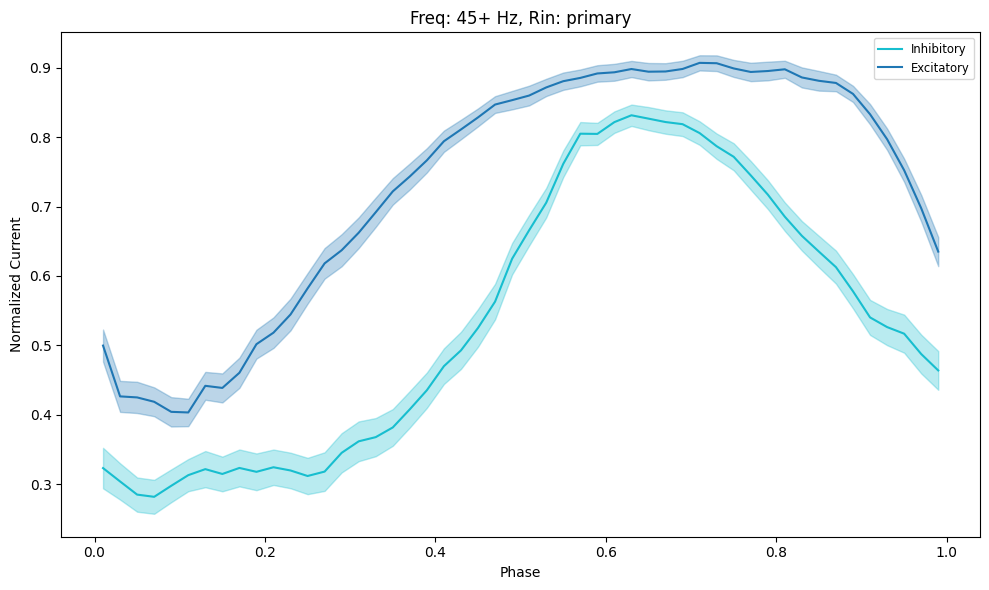

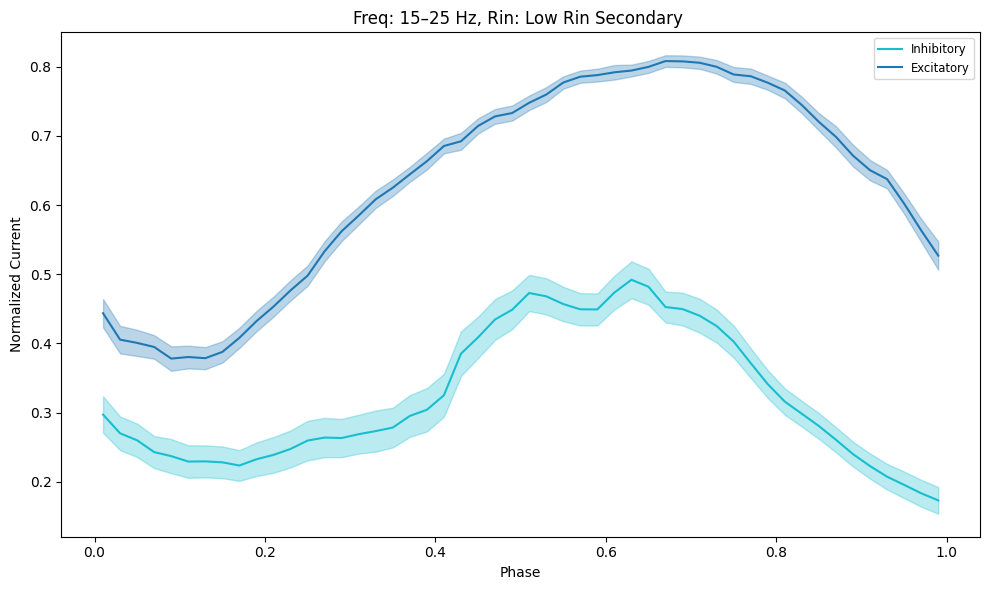

...

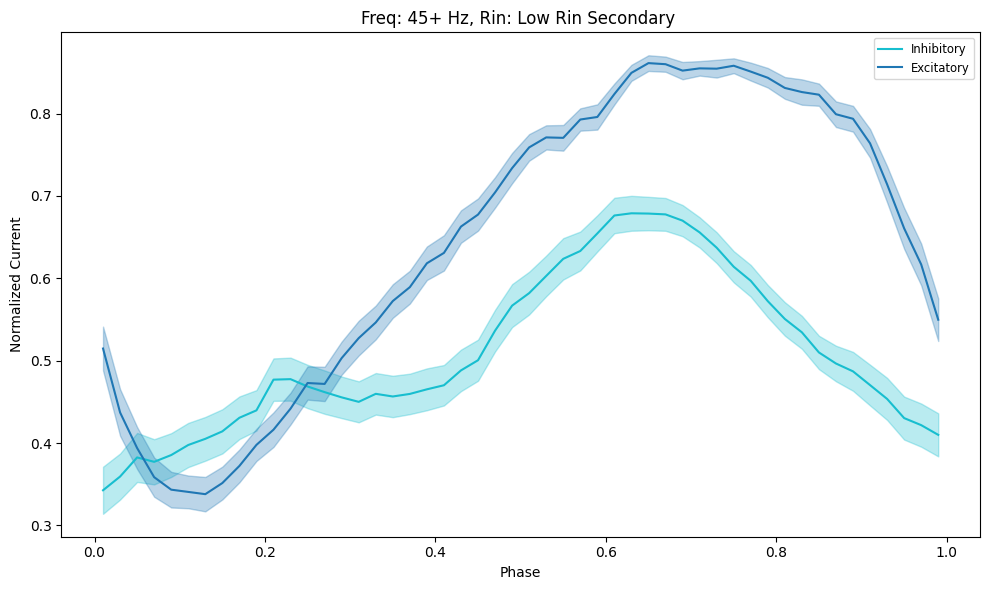

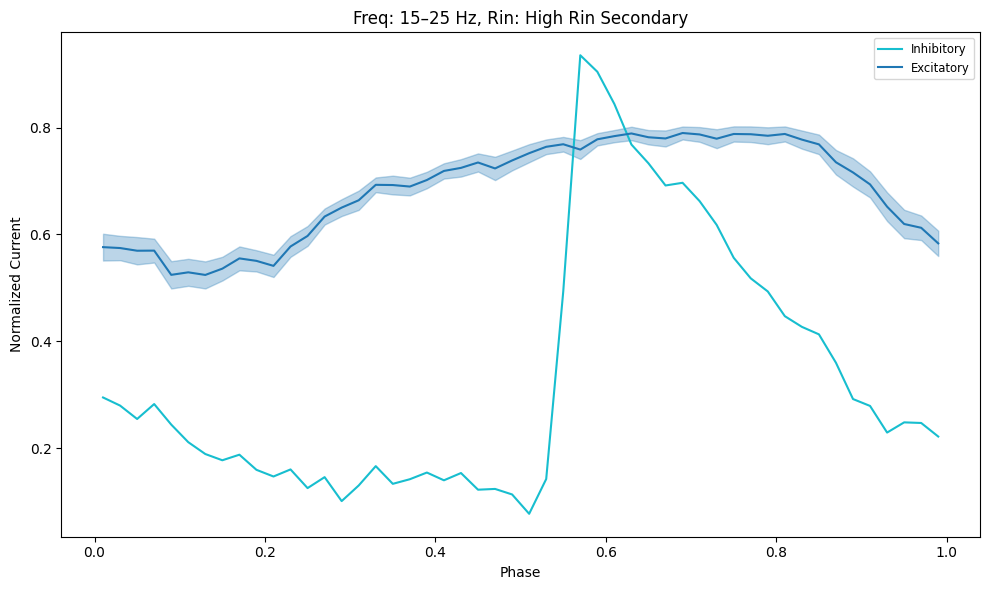

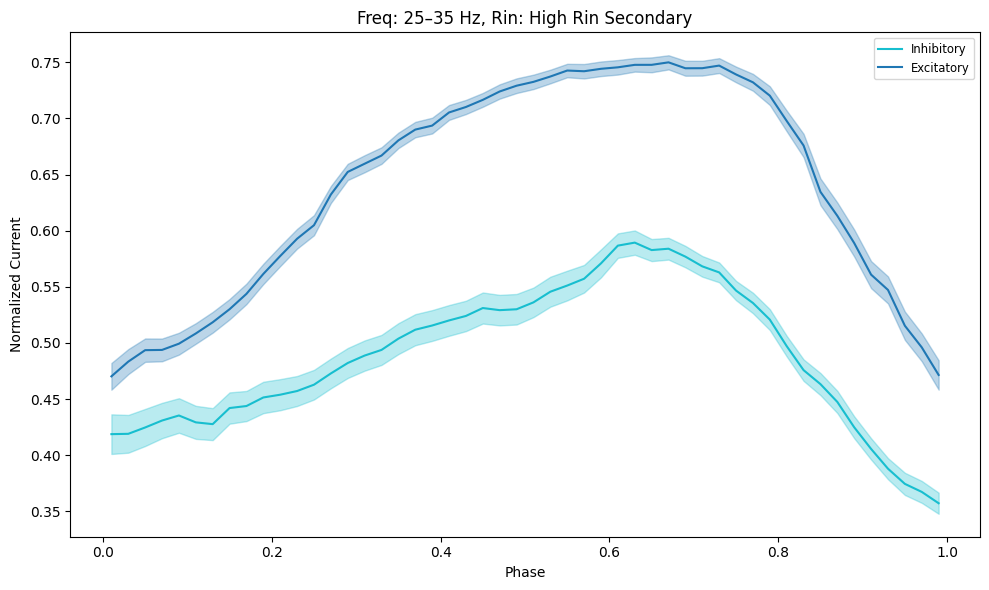

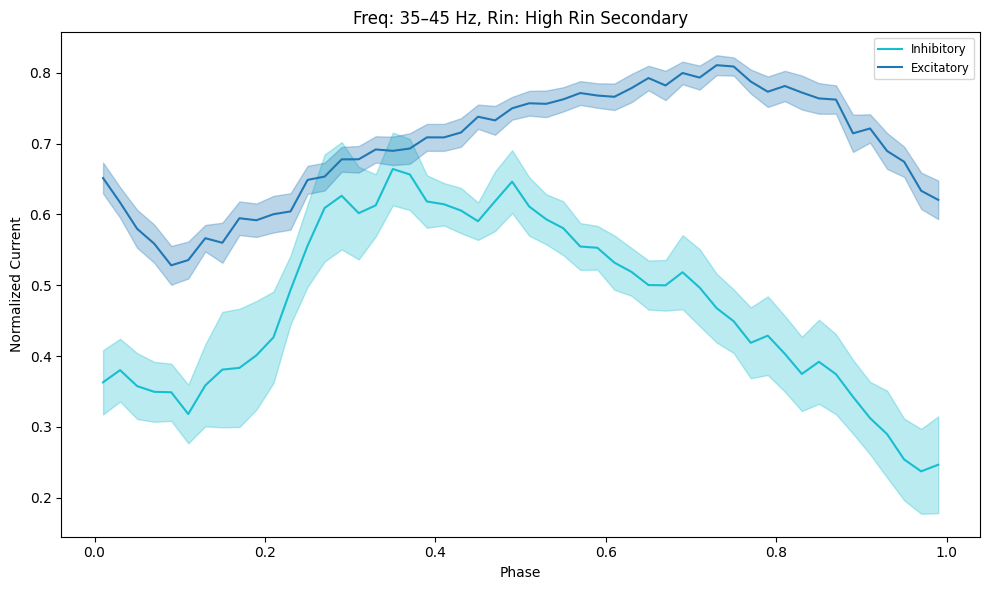

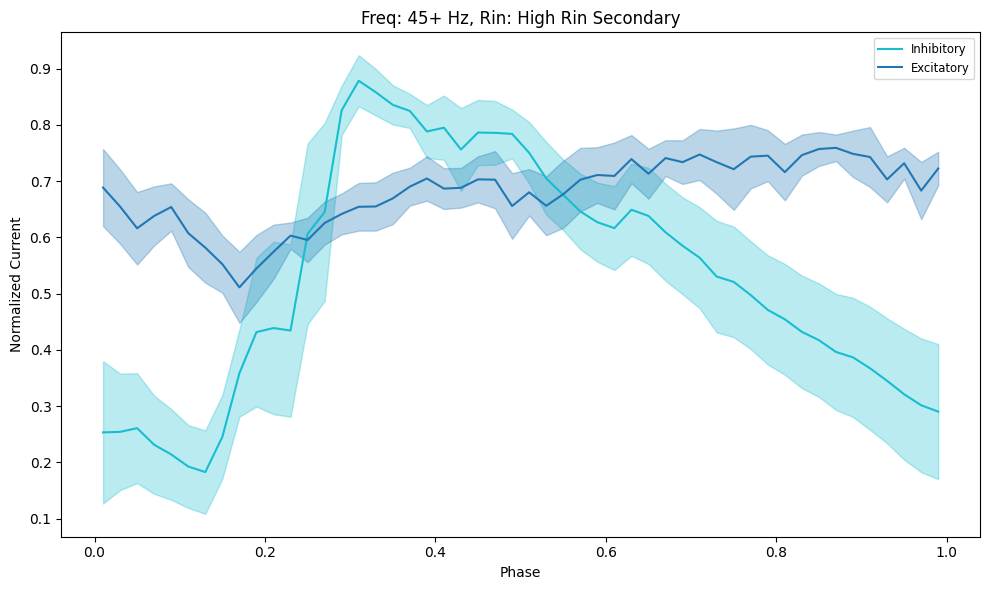

In [37]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

freq_bins = ["15–25", "25–35", "35–45", "45+"]
rin_categories = ["primary", "Low Rin Secondary ", "High Rin Secondary"]
signal_types = ["Inhibitory", "Excitatory"]

# Assign unique colors to signal types
cmap = cm.get_cmap('tab10', len(signal_types))
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

for speed in rin_categories:
    for freq_bin in freq_bins:
        fig, ax = plt.subplots(figsize=(10, 6))
        
        # Filter keys for this freq_bin and speed, ignoring freq_bin == '<15'
        matching_keys = [key for key in binned_waveforms.keys()
                         if get_freq_bin(key[0]) == freq_bin and
                            key[3] == speed and
                            get_freq_bin(key[0]) != '<15']

        # Track labels used to avoid duplicates
        used_labels = set()
        
        for signal_type in signal_types:
            # Filter keys further by signal_type
            keys_for_signal = [k for k in matching_keys if k[1] == signal_type]
            if not keys_for_signal:
                continue
            
            # Collect dataframes for this signal_type
            dfs = [binned_waveforms[key].copy() for key in keys_for_signal]
            combined = pd.concat(dfs)
            grouped = combined.groupby('Phase Bin', observed=False)
            averaged = grouped.mean().reset_index()
            sem = grouped.sem().reset_index()

            label = signal_type if signal_type not in used_labels else None
            ax.plot(averaged['Phase'], averaged['Normalized Current'],
                    label=label, color=signal_type_colors[signal_type])
            ax.fill_between(averaged['Phase'],
                            averaged['Normalized Current'] - sem['Normalized Current'],
                            averaged['Normalized Current'] + sem['Normalized Current'],
                            color=signal_type_colors[signal_type], alpha=0.3)
            used_labels.add(signal_type)

        ax.set_title(f"Freq: {freq_bin} Hz, Rin: {speed}")
        ax.set_xlabel('Phase')
        ax.set_ylabel('Normalized Current')
        ax.legend(fontsize='small')
        plt.tight_layout()
        plt.show()
